<a href="https://colab.research.google.com/github/Jorge-Calderon21/challenge1-data-science/blob/main/AluraStoreLatam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importación de datos



In [42]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [22]:
ingreso_tienda_1 = tienda["Precio"].sum()
ingreso_tienda_2 = tienda2["Precio"].sum()
ingreso_tienda_3 = tienda3["Precio"].sum()
ingreso_tienda_4 = tienda4["Precio"].sum()

print(f"Ingreso total Tienda 1: ${ingreso_tienda_1:,.2f}")
print(f"Ingreso total Tienda 2: ${ingreso_tienda_2:,.2f}")
print(f"Ingreso total Tienda 3: ${ingreso_tienda_3:,.2f}")
print(f"Ingreso total Tienda 4: ${ingreso_tienda_4:,.2f}")

Ingreso total Tienda 1: $1,150,880,400.00
Ingreso total Tienda 2: $1,116,343,500.00
Ingreso total Tienda 3: $1,098,019,600.00
Ingreso total Tienda 4: $1,038,375,700.00


In [23]:
# Diccionario con los ingresos
ingresos_dict = {
    "Tienda 1": ingreso_tienda_1,
    "Tienda 2": ingreso_tienda_2,
    "Tienda 3": ingreso_tienda_3,
    "Tienda 4": ingreso_tienda_4
}

# Tienda con mayor y menor ingreso
mayor_tienda = max(ingresos_dict, key=ingresos_dict.get)
menor_tienda = min(ingresos_dict, key=ingresos_dict.get)

# Impresión de conclusión
print()
print(f"La tienda con mayores ingresos es: {mayor_tienda} con un total de ${ingresos_dict[mayor_tienda]:,.2f}.")
print(f"La tienda con menores ingresos es: {menor_tienda} con un total de ${ingresos_dict[menor_tienda]:,.2f}.")



La tienda con mayores ingresos es: Tienda 1 con un total de $1,150,880,400.00.
La tienda con menores ingresos es: Tienda 4 con un total de $1,038,375,700.00.


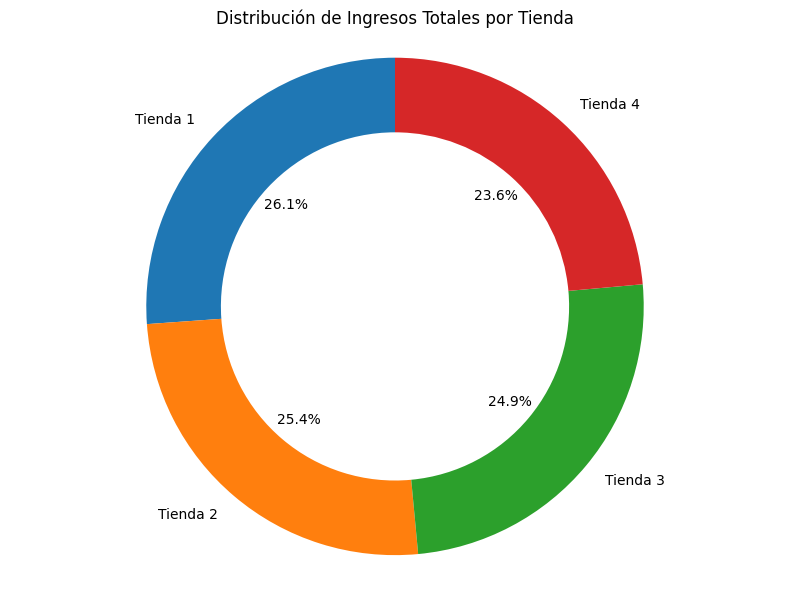

In [64]:
import matplotlib.pyplot as plt

# Diccionario de ingresos
ingresos = {
    "Tienda 1": ingreso_tienda_1,
    "Tienda 2": ingreso_tienda_2,
    "Tienda 3": ingreso_tienda_3,
    "Tienda 4": ingreso_tienda_4
}

# Listas para el gráfico
labels = list(ingresos.keys())
valores = list(ingresos.values())

# Gráfico de pastel con "hueco" (tipo dona)
plt.figure(figsize=(8, 6))
wedges, texts, autotexts = plt.pie(
    valores,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    wedgeprops=dict(width=0.3),  # Esto hace el hueco tipo “dona”
    textprops=dict(color="black")
)

plt.title("Distribución de Ingresos Totales por Tienda")
plt.axis('equal')  # Mantiene forma circular
plt.tight_layout()
plt.show()


# 2. Ventas por categoría

In [25]:
tiendas = [(tienda, "Tienda 1"), (tienda2, "Tienda 2"), (tienda3, "Tienda 3"), (tienda4, "Tienda 4")]

# Diccionario para guardar los conteos por tienda
categorias_por_tienda = {}

# También guardamos para mostrar los resultados en consola
for df, nombre in tiendas:
    categorias = df["Categoría del Producto"].tolist()
    conteo = {}

    for cat in categorias:
        conteo[cat] = conteo.get(cat, 0) + 1

    # Guardamos el conteo para graficar después
    categorias_por_tienda[nombre] = conteo

    # Mostrar resultados en pantalla como antes
    print(f"\nVentas por categoría en {nombre}:")
    for cat, val in conteo.items():
        print(f"- {cat}: {val} ventas")

    top = max(conteo, key=conteo.get)
    print(f"Más vendida: {top} ({conteo[top]} ventas)")


Ventas por categoría en Tienda 1:
- Electrónicos: 448 ventas
- Muebles: 465 ventas
- Juguetes: 324 ventas
- Electrodomésticos: 312 ventas
- Artículos para el hogar: 171 ventas
- Deportes y diversión: 284 ventas
- Libros: 173 ventas
- Instrumentos musicales: 182 ventas
Más vendida: Muebles (465 ventas)

Ventas por categoría en Tienda 2:
- Muebles: 442 ventas
- Instrumentos musicales: 224 ventas
- Deportes y diversión: 275 ventas
- Electrónicos: 422 ventas
- Artículos para el hogar: 181 ventas
- Juguetes: 313 ventas
- Electrodomésticos: 305 ventas
- Libros: 197 ventas
Más vendida: Muebles (442 ventas)

Ventas por categoría en Tienda 3:
- Electrodomésticos: 278 ventas
- Muebles: 499 ventas
- Instrumentos musicales: 177 ventas
- Deportes y diversión: 277 ventas
- Electrónicos: 451 ventas
- Juguetes: 315 ventas
- Artículos para el hogar: 177 ventas
- Libros: 185 ventas
Más vendida: Muebles (499 ventas)

Ventas por categoría en Tienda 4:
- Electrodomésticos: 254 ventas
- Muebles: 480 ventas

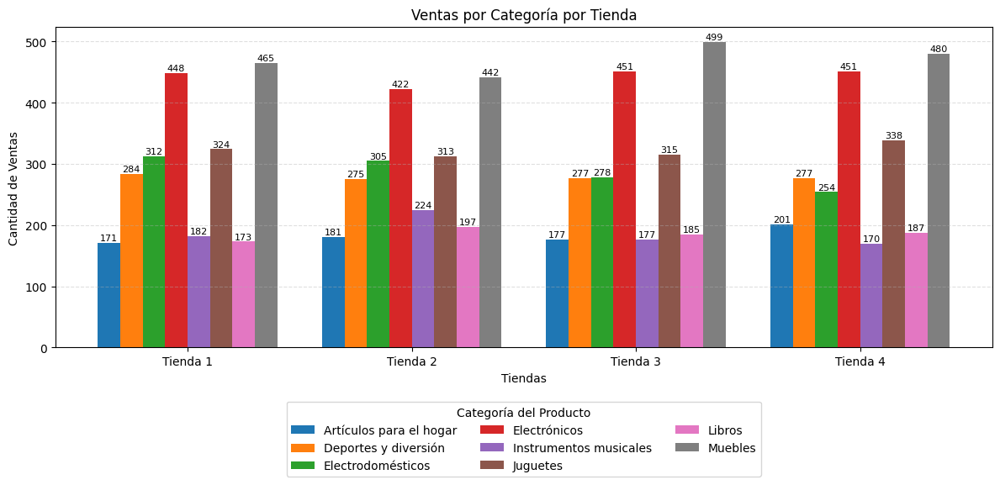

In [26]:
#Categorías únicas
todas_las_categorias = set()
for conteo in categorias_por_tienda.values():
    todas_las_categorias.update(conteo.keys())
todas_las_categorias = sorted(todas_las_categorias)

#Preparar datos
tiendas_nombres = list(categorias_por_tienda.keys())
datos = {categoria: [] for categoria in todas_las_categorias}

for categoria in todas_las_categorias:
    for tienda in tiendas_nombres:
        valor = categorias_por_tienda[tienda].get(categoria, 0)
        datos[categoria].append(valor)

# Graficar con barras agrupadas
num_tiendas = len(tiendas_nombres)
num_categorias = len(todas_las_categorias)
ancho = 0.10

# Posiciones base para las tiendas
espacio_entre_tiendas = 1.0
pos_base = [i * espacio_entre_tiendas for i in range(num_tiendas)]
centros = [p + ancho * (num_categorias - 1) / 2 for p in pos_base]

# Crear gráfico
plt.figure(figsize=(12, 6))

for i, categoria in enumerate(todas_las_categorias):
    desplazamiento = [p + i * ancho for p in pos_base]
    valores = datos[categoria]
    barras = plt.bar(desplazamiento, valores, width=ancho, label=categoria)

    # Agregar etiquetas numéricas arriba de cada barra
    for x, y in zip(desplazamiento, valores):
        plt.text(x, y + 1, str(y), ha='center', va='bottom', fontsize=8)

# Etiquetas centradas
plt.xticks(centros, tiendas_nombres)

plt.title("Ventas por Categoría por Tienda")
plt.xlabel("Tiendas")
plt.ylabel("Cantidad de Ventas")
plt.grid(axis="y", linestyle="--", alpha=0.4)

# Leyenda abajo, centrada
plt.legend(
    title="Categoría del Producto",
    loc="upper center",
    bbox_to_anchor=(0.5, -0.15),
    ncol=3
)

plt.tight_layout()
plt.show()

# 3. Calificación promedio de la tienda


In [27]:
# Diccionario para guardar promedios
promedios = {}

# Calcular promedio para cada tienda
for df, nombre in tiendas:
    calificaciones = df["Calificación"].tolist()
    promedio = sum(calificaciones) / len(calificaciones)
    promedios[nombre] = promedio
    print(f"Valoración promedio de {nombre}: {promedio:.2f}")

# Identificar mejor y peor tienda
mejor = max(promedios, key=promedios.get)
peor = min(promedios, key=promedios.get)

print(f"\nMejor calificación: {mejor} ({promedios[mejor]:.2f})")
print(f"Peor calificación: {peor} ({promedios[peor]:.2f})")

Valoración promedio de Tienda 1: 3.98
Valoración promedio de Tienda 2: 4.04
Valoración promedio de Tienda 3: 4.05
Valoración promedio de Tienda 4: 4.00

Mejor calificación: Tienda 3 (4.05)
Peor calificación: Tienda 1 (3.98)


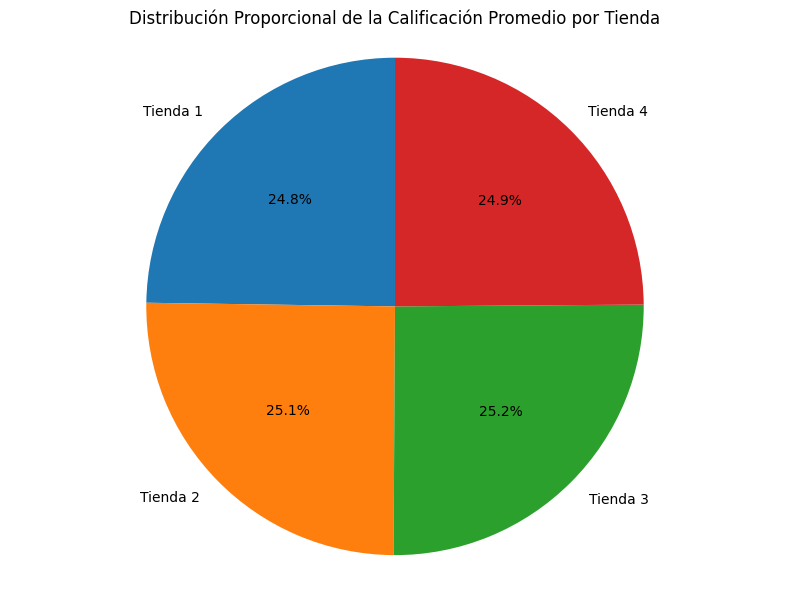

In [28]:
# Preparar los datos del diccionario promedios
tiendas = list(promedios.keys())
valores = list(promedios.values())

# Crear gráfico de pastel
plt.figure(figsize=(8, 6))
plt.pie(valores, labels=tiendas, autopct='%1.1f%%', startangle=90)
plt.title("Distribución Proporcional de la Calificación Promedio por Tienda")
plt.axis("equal")  # Mantiene el pastel redondo
plt.tight_layout()
plt.show()


# 4. Productos más y menos vendidos

In [69]:
tiendas = [
    (tienda, "Tienda 1"),
    (tienda2, "Tienda 2"),
    (tienda3, "Tienda 3"),
    (tienda4, "Tienda 4")
]

# Recolectar datos
productos_maximos = []
productos_minimos = []
nombres_tiendas = []

for df, nombre in tiendas:
    productos = df["Producto"].tolist()
    conteo = {}

    for p in productos:
        conteo[p] = conteo.get(p, 0) + 1

    mas_vendido = max(conteo, key=conteo.get)
    menos_vendido = min(conteo, key=conteo.get)

    nombres_tiendas.append(nombre)
    productos_maximos.append((mas_vendido, conteo[mas_vendido]))
    productos_minimos.append((menos_vendido, conteo[menos_vendido]))

    # Mostrar en consola como ya hacías
    print(f"\n{nombre}")
    print(f"Más vendido: {mas_vendido} ({conteo[mas_vendido]} ventas)")
    print(f"Menos vendido: {menos_vendido} ({conteo[menos_vendido]} ventas)")


Tienda 1
Más vendido: Microondas (60 ventas)
Menos vendido: Auriculares con micrófono (33 ventas)

Tienda 2
Más vendido: Iniciando en programación (65 ventas)
Menos vendido: Juego de mesa (32 ventas)

Tienda 3
Más vendido: Kit de bancas (57 ventas)
Menos vendido: Bloques de construcción (35 ventas)

Tienda 4
Más vendido: Cama box (62 ventas)
Menos vendido: Guitarra eléctrica (33 ventas)


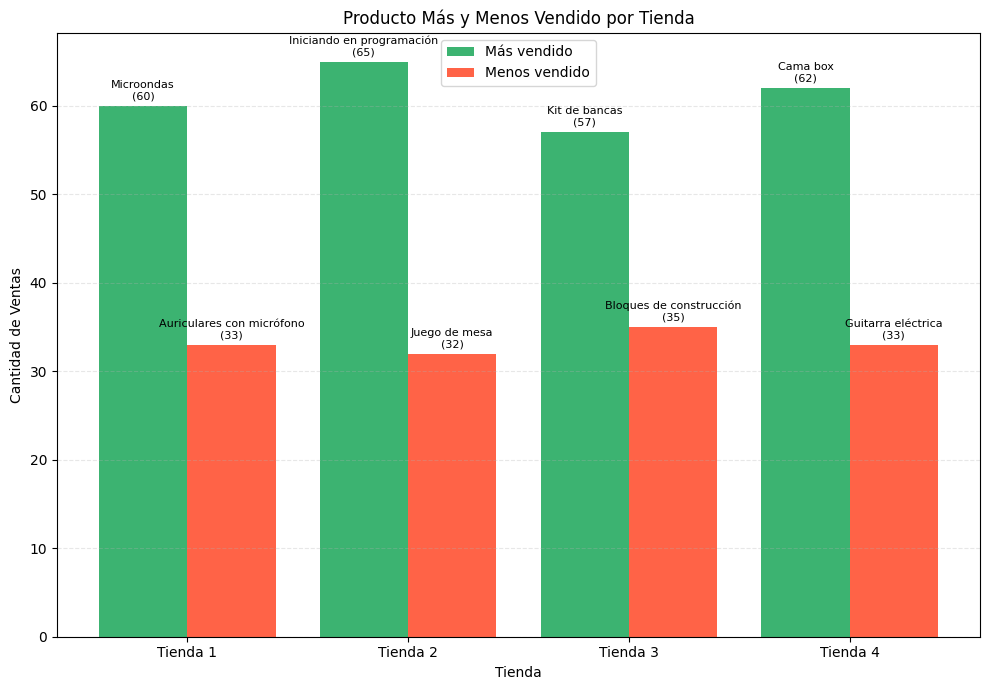

In [80]:
x = range(len(nombres_tiendas))
valores_max = [item[1] for item in productos_maximos]
valores_min = [item[1] for item in productos_minimos]
nombres_max = [item[0] for item in productos_maximos]
nombres_min = [item[0] for item in productos_minimos]

# Paso 4: Graficar
plt.figure(figsize=(10, 7))

bar_width = 0.4
plt.bar([i - bar_width/2 for i in x], valores_max, width=bar_width, label='Más vendido', color='mediumseagreen')
plt.bar([i + bar_width/2 for i in x], valores_min, width=bar_width, label='Menos vendido', color='tomato')

# Etiquetas arriba de las barras
for i in x:
    plt.text(i - bar_width/2, valores_max[i] + 0.5, f"{nombres_max[i]}\n({valores_max[i]})",
             ha='center', va='bottom', fontsize=8)
    plt.text(i + bar_width/2, valores_min[i] + 0.5, f"{nombres_min[i]}\n({valores_min[i]})",
             ha='center', va='bottom', fontsize=8)

plt.xticks(x, nombres_tiendas)
plt.title("Producto Más y Menos Vendido por Tienda")
plt.xlabel("Tienda")
plt.ylabel("Cantidad de Ventas")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# 5. Envío promedio por tienda

In [88]:
# Paso 1: Definición correcta de tiendas
tiendas = [
    (tienda, "Tienda 1"),
    (tienda2, "Tienda 2"),
    (tienda3, "Tienda 3"),
    (tienda4, "Tienda 4")
]

# Paso 2: Calcular promedio de envío
promedios_envio = {}

for df, nombre in tiendas:
    envios = df["Costo de envío"].tolist()
    promedio = sum(envios) / len(envios)
    promedios_envio[nombre] = promedio
    print(f"Promedio de envío en {nombre}: ${promedio:,.2f}")

# Paso 3: Mejor y peor
mas_caro = max(promedios_envio, key=promedios_envio.get)
mas_barato = min(promedios_envio, key=promedios_envio.get)

print(f"\nEnvío más caro: {mas_caro} (${promedios_envio[mas_caro]:,.2f})")
print(f"Envío más barato: {mas_barato} (${promedios_envio[mas_barato]:,.2f})")


Promedio de envío en Tienda 1: $26,018.61
Promedio de envío en Tienda 2: $25,216.24
Promedio de envío en Tienda 3: $24,805.68
Promedio de envío en Tienda 4: $23,459.46

Envío más caro: Tienda 1 ($26,018.61)
Envío más barato: Tienda 4 ($23,459.46)


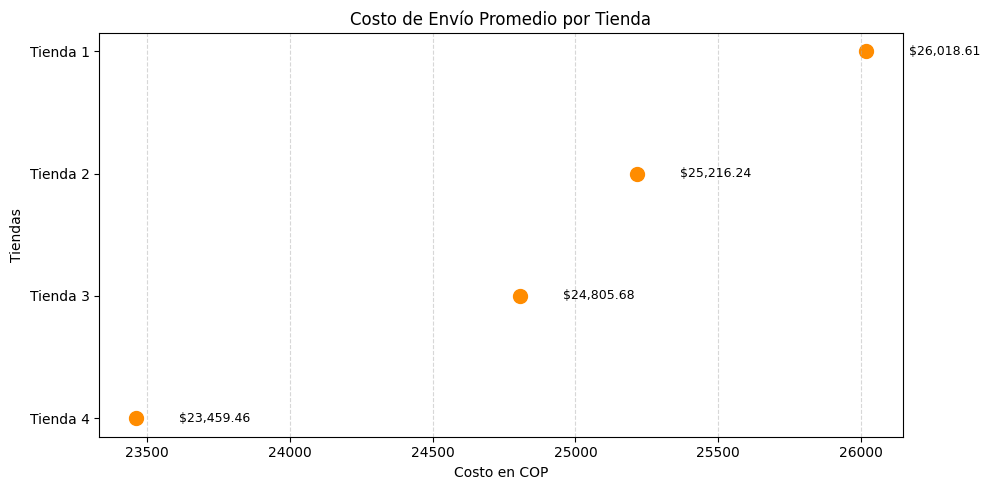

In [89]:
# Extraer listas ordenadas
tiendas = list(promedios_envio.keys())
valores = list(promedios_envio.values())

# Ordenamos por valor para mejor visualización
tiendas_ordenadas = [x for _, x in sorted(zip(valores, tiendas))]
valores_ordenados = sorted(valores)

# Crear gráfico
plt.figure(figsize=(10, 5))
plt.scatter(valores_ordenados, tiendas_ordenadas, color='darkorange', s=100)

# Mostrar valores exactos con 2 decimales
for x, y in zip(valores_ordenados, tiendas_ordenadas):
    plt.text(x + 150, y, f"${x:,.2f}", va='center', fontsize=9)

plt.title("Costo de Envío Promedio por Tienda")
plt.xlabel("Costo en COP")
plt.ylabel("Tiendas")
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [90]:
# Usamos los diccionarios y listas que ya generaste en el análisis
# Asegurate de tener antes:
# - ingresos = {...}
# - promedios_calificacion = {...}
# - promedios_envio = {...}
# - productos_maximos = [...]
# - productos_minimos = [...]
# - nombres_tiendas = [...]

print("INFORME FINAL – RECOMENDACIÓN DE TIENDA A VENDER")
print("="*60)

# Introducción
print("\nINTRODUCCIÓN\n")
print("Este informe presenta un análisis comparativo de las cuatro tiendas de la cadena Alura Store.")
print("El objetivo es determinar cuál tienda debería ser vendida por el Sr. Juan para facilitar un nuevo emprendimiento.")
print("Se evaluaron ingresos, categorías vendidas, calificación de los clientes, productos más/menos vendidos y costos de envío.")

# Análisis por criterios
print("\nANÁLISIS POR CRITERIOS\n")

# Ingresos
tienda_mayor_ingreso = max(ingresos, key=ingresos.get)
tienda_menor_ingreso = min(ingresos, key=ingresos.get)
print(f"1. Ingresos Totales:")
for t, val in ingresos.items():
    print(f"- {t}: ${val:,.2f}")
print(f"=> Mayor ingreso: {tienda_mayor_ingreso}")
print(f"=> Menor ingreso: {tienda_menor_ingreso}")

# Calificaciones
tienda_mejor_calif = max(promedios, key=promedios.get)
tienda_peor_calif = min(promedios, key=promedios.get)
print(f"\n2. Calificación Promedio de los Clientes:")
for t, val in promedios.items():
    print(f"- {t}: {val:.2f}")
print(f"=> Mejor calificación: {tienda_mejor_calif}")
print(f"=> Peor calificación: {tienda_peor_calif}")

# Costo de envío
tienda_envio_mas_caro = max(promedios_envio, key=promedios_envio.get)
tienda_envio_mas_barato = min(promedios_envio, key=promedios_envio.get)
print(f"\n3. Costo de Envío Promedio:")
for t, val in promedios_envio.items():
    print(f"- {t}: ${val:,.2f}")
print(f"=> Envío más caro: {tienda_envio_mas_caro}")
print(f"=> Envío más barato: {tienda_envio_mas_barato}")

# Productos más y menos vendidos
print(f"\n4. Productos Más y Menos Vendidos:")
for i in range(len(nombres_tiendas)):
    print(f"- {nombres_tiendas[i]}:")
    print(f"   Más vendido: {productos_maximos[i][0]} ({productos_maximos[i][1]} ventas)")
    print(f"   Menos vendido: {productos_minimos[i][0]} ({productos_minimos[i][1]} ventas)")

# Conclusión
print("\nCONCLUSIÓN\n")

print(f"Según el análisis, aunque la Tienda 4 presenta el costo de envío más bajo (${promedios_envio['Tienda 4']:,.2f}) y una calificación promedio aceptable ({promedios['Tienda 4']:.2f}),")
print(f"es también la tienda con los menores ingresos (${ingresos['Tienda 4']:,.2f}) entre todas, lo que impacta directamente en la rentabilidad del negocio.")
print("Además, su producto más vendido tiene un volumen comparable al de otras tiendas, pero no compensa su bajo rendimiento financiero general.")

print("\nPor tanto, se recomienda al Sr. Juan vender la Tienda 4, ya que es la menos rentable del conjunto y tiene menos indicadores fuertes en comparación con las demás.")



INFORME FINAL – RECOMENDACIÓN DE TIENDA A VENDER

INTRODUCCIÓN

Este informe presenta un análisis comparativo de las cuatro tiendas de la cadena Alura Store.
El objetivo es determinar cuál tienda debería ser vendida por el Sr. Juan para facilitar un nuevo emprendimiento.
Se evaluaron ingresos, categorías vendidas, calificación de los clientes, productos más/menos vendidos y costos de envío.

ANÁLISIS POR CRITERIOS

1. Ingresos Totales:
- Tienda 1: $1,150,880,400.00
- Tienda 2: $1,116,343,500.00
- Tienda 3: $1,098,019,600.00
- Tienda 4: $1,038,375,700.00
=> Mayor ingreso: Tienda 1
=> Menor ingreso: Tienda 4

2. Calificación Promedio de los Clientes:
- Tienda 1: 3.98
- Tienda 2: 4.04
- Tienda 3: 4.05
- Tienda 4: 4.00
=> Mejor calificación: Tienda 3
=> Peor calificación: Tienda 1

3. Costo de Envío Promedio:
- Tienda 1: $26,018.61
- Tienda 2: $25,216.24
- Tienda 3: $24,805.68
- Tienda 4: $23,459.46
=> Envío más caro: Tienda 1
=> Envío más barato: Tienda 4

4. Productos Más y Menos Vendido

# 6. Análisis Geográfico

In [93]:
!pip install folium

In [95]:
# Crear copia de cada DataFrame con columna 'Tienda'
tienda1_geo = tienda.copy()
tienda1_geo["Tienda"] = "Tienda 1"

tienda2_geo = tienda2.copy()
tienda2_geo["Tienda"] = "Tienda 2"

tienda3_geo = tienda3.copy()
tienda3_geo["Tienda"] = "Tienda 3"

tienda4_geo = tienda4.copy()
tienda4_geo["Tienda"] = "Tienda 4"

# Unir todo en un solo DataFrame
df_geo = pd.concat([tienda1_geo, tienda2_geo, tienda3_geo, tienda4_geo], ignore_index=True)

In [96]:
import folium
from folium.plugins import MarkerCluster

# Crear el mapa centrado en un punto medio (aproximado)
m = folium.Map(location=[df_geo["lat"].mean(), df_geo["lon"].mean()], zoom_start=5)

# Agrupar los marcadores por tienda
colors = {
    "Tienda 1": "blue",
    "Tienda 2": "green",
    "Tienda 3": "red",
    "Tienda 4": "purple"
}

cluster = MarkerCluster().add_to(m)

# Agregar marcadores al mapa
for _, row in df_geo.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=3,
        popup=f'{row["Tienda"]} - {row["Producto"]}',
        color=colors[row["Tienda"]],
        fill=True,
        fill_color=colors[row["Tienda"]],
        fill_opacity=0.5
    ).add_to(cluster)

# Mostrar el mapa
m
